<a href="https://colab.research.google.com/github/SaranNeelam/SaranNeelam/blob/main/Random_forest.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
df = pd.read_csv('kyphosis.csv')

In [ ]:
df.head()

,Kyphosis,Age,Number,Start
0,absent,71,3,5
1,absent,158,3,14
2,present,128,4,5
3,absent,2,5,1
4,absent,1,4,15


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 81 entries, 0 to 80
Data columns (total 4 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   Kyphosis  81 non-null     object
 1   Age       81 non-null     int64 
 2   Number    81 non-null     int64 
 3   Start     81 non-null     int64 
dtypes: int64(3), object(1)
memory usage: 2.7+ KB


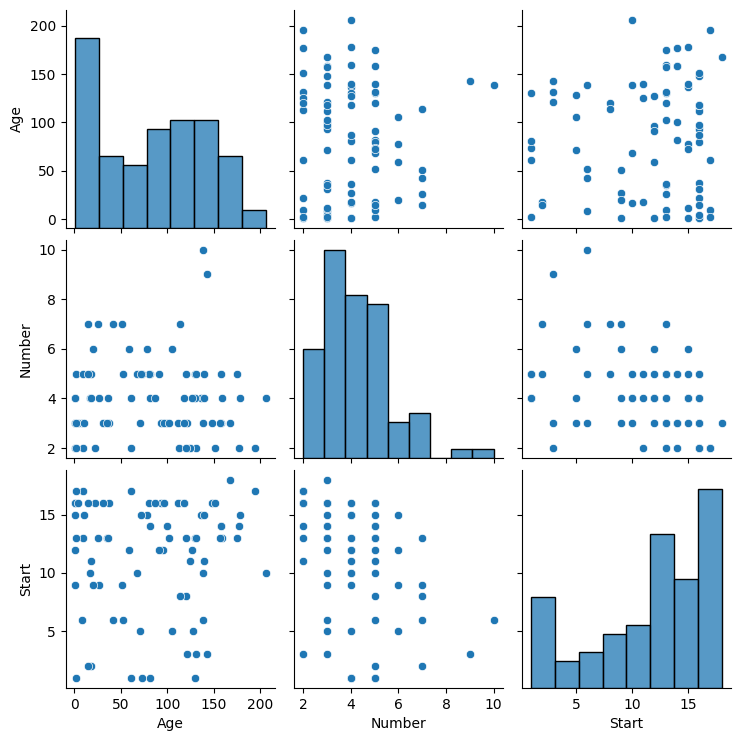

In [ ]:
sns.pairplot(df)

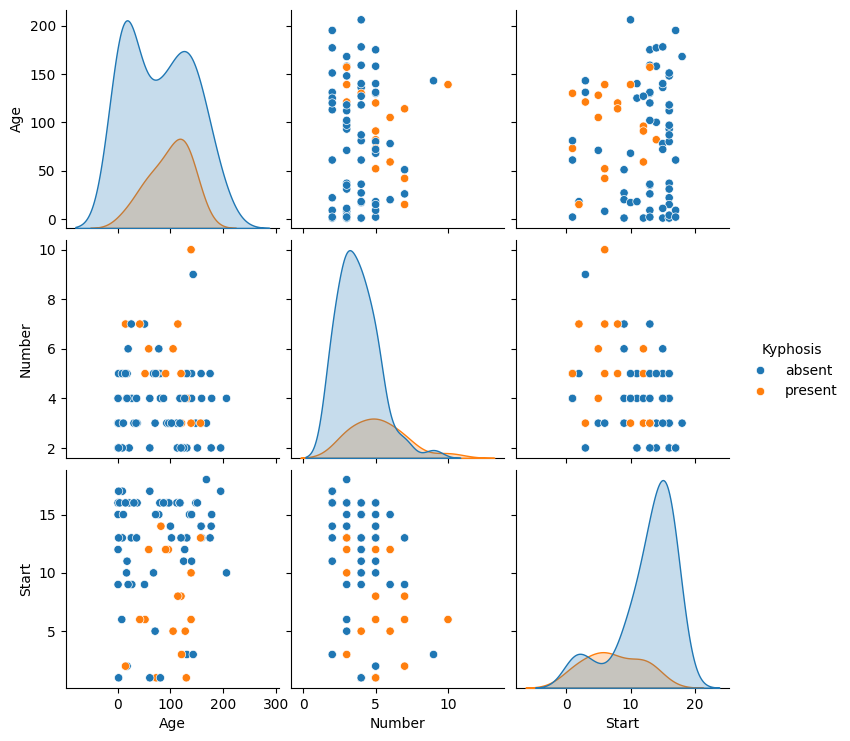

In [ ]:
sns.pairplot(df, hue='Kyphosis')

In [ ]:
from sklearn.model_selection import train_test_split

In [ ]:
X = df.drop('Kyphosis', axis=1)
y = df['Kyphosis']

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=0.2, random_state=101)

In [ ]:
from sklearn.tree import DecisionTreeClassifier

In [ ]:
Dtree = DecisionTreeClassifier(criterion='entropy')

In [ ]:
Dtree.fit(X_train, y_train)

DecisionTreeClassifier(criterion='entropy')

In [ ]:
preds = Dtree.predict(X_test)

In [ ]:
from sklearn.metrics import confusion_matrix,classification_report

In [ ]:
print(classification_report(y_test, preds))

              precision    recall  f1-score   support

      absent       0.92      1.00      0.96        12
     present       1.00      0.80      0.89         5

    accuracy                           0.94        17
   macro avg       0.96      0.90      0.92        17
weighted avg       0.95      0.94      0.94        17



In [ ]:
confusion_matrix(y_test, preds)

array([[12,  0],
       [ 1,  4]])

In [ ]:
pred_train = Dtree.predict(X_train)

In [ ]:
print(classification_report(y_train,pred_train))

              precision    recall  f1-score   support

      absent       1.00      1.00      1.00        52
     present       1.00      1.00      1.00        12

    accuracy                           1.00        64
   macro avg       1.00      1.00      1.00        64
weighted avg       1.00      1.00      1.00        64



In [ ]:
confusion_matrix(y_train, pred_train)

array([[52,  0],
       [ 0, 12]])

In [ ]:
from IPython.display import Image
from six import StringIO
from sklearn.tree import  export_graphviz
import pydot

In [ ]:
features=list(df.columns[1:])

In [ ]:
features

['Age', 'Number', 'Start']

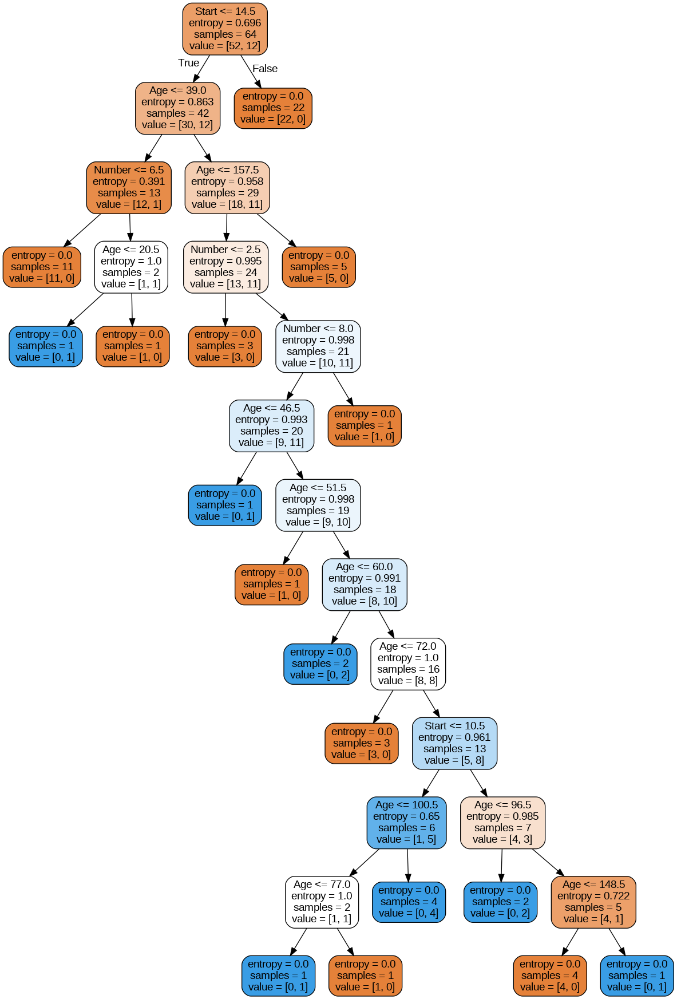

In [ ]:
dot_data = StringIO()
export_graphviz(Dtree, out_file=dot_data, feature_names= features, filled=True, rounded=True)

graph = pydot.graph_from_dot_data(dot_data.getvalue())
Image(graph[0].create_png())

In [ ]:
single_data = pd.DataFrame([{'Age':120, 'Number': 2, 'Start':2}])

In [ ]:
Dtree.predict(single_data)

array(['absent'], dtype=object)

In [ ]:
from sklearn.tree import DecisionTreeClassifier
Dtree = DecisionTreeClassifier(criterion='entropy')
Dtree.fit(X_train, y_train)
preds = Dtree.predict(single_data)
print(preds)

['absent']


In [ ]:
Dtree_hyp = DecisionTreeClassifier(criterion='gini', max_depth = 5, min_samples_split= 0.1, min_samples_leaf=2)

In [ ]:
Dtree_hyp.fit(X_train,y_train)

DecisionTreeClassifier(max_depth=5, min_samples_leaf=2, min_samples_split=0.1)

In [ ]:
preds_hyp = Dtree_hyp.predict(X_train)

In [ ]:
print(classification_report(y_test, preds_hyp))

              precision    recall  f1-score   support

      absent       1.00      1.00      1.00        12
     present       1.00      1.00      1.00         5

    accuracy                           1.00        17
   macro avg       1.00      1.00      1.00        17
weighted avg       1.00      1.00      1.00        17



In [ ]:
preds_hyp = Dtree_hyp.predict(X_test)
print(classification_report(y_test, preds_hyp))

              precision    recall  f1-score   support

      absent       1.00      1.00      1.00        12
     present       1.00      1.00      1.00         5

    accuracy                           1.00        17
   macro avg       1.00      1.00      1.00        17
weighted avg       1.00      1.00      1.00        17



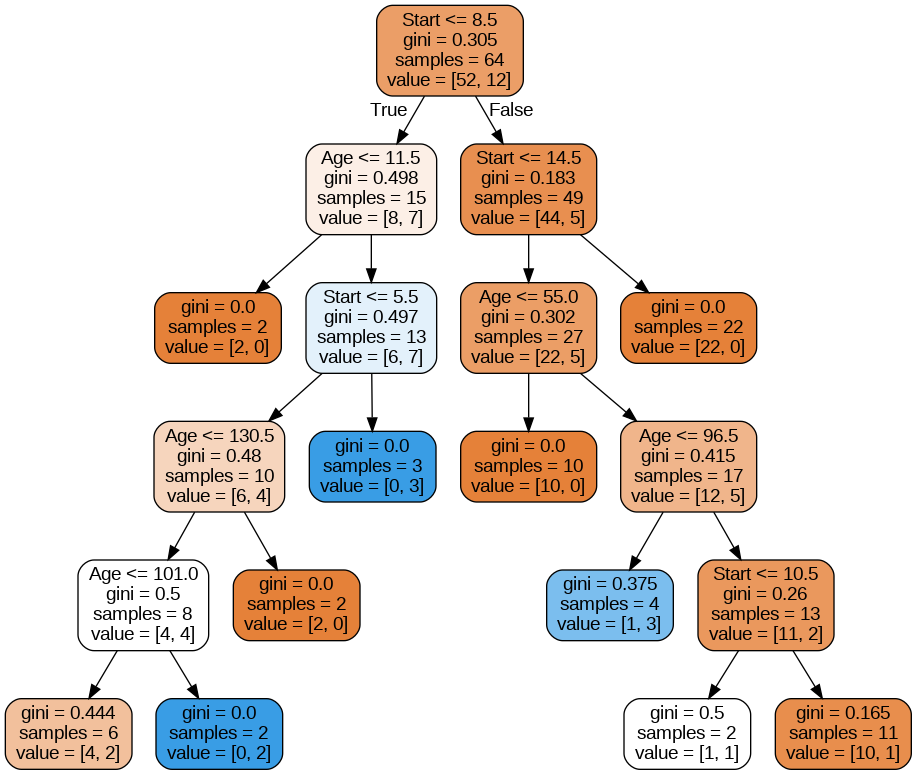

In [ ]:
dot_data=StringIO()
export_graphviz(Dtree_hyp, out_file=dot_data,feature_names=features,filled = True, rounded=True)

graph = pydot.graph_from_dot_data(dot_data.getvalue())
Image(graph[0]. create_png())

In [ ]:
from sklearn.ensemble import RandomForestClassifier

In [ ]:
rfc = RandomForestClassifier()

In [ ]:
rfc.fit(X_train, y_train)

RandomForestClassifier()

In [ ]:
rfc_preds = rfc.predict(X_test)

In [ ]:
confusion_matrix(y_test, rfc_preds)

array([[12,  0],
       [ 3,  2]])

In [ ]:
print(classification_report(y_test, rfc_preds))

              precision    recall  f1-score   support

      absent       0.80      1.00      0.89        12
     present       1.00      0.40      0.57         5

    accuracy                           0.82        17
   macro avg       0.90      0.70      0.73        17
weighted avg       0.86      0.82      0.80        17



In [ ]:
rfc_1 = RandomForestClassifier(n_estimators=100, bootstrap=True, criterion="entropy")

In [ ]:
rfc_1.fit(X_train, y_train)

RandomForestClassifier(criterion='entropy')

In [ ]:
rfc_1_preds = rfc_1.predict(X_test)
confusion_matrix(y_test, rfc_1_preds)

array([[12,  0],
       [ 3,  2]])

In [ ]:
print(classification_report(y_test, rfc_1_preds))

              precision    recall  f1-score   support

      absent       0.80      1.00      0.89        12
     present       1.00      0.40      0.57         5

    accuracy                           0.82        17
   macro avg       0.90      0.70      0.73        17
weighted avg       0.86      0.82      0.80        17



In [ ]:
y_features = rfc.feature_importances_
y_features

array([0.42791228, 0.19597036, 0.37611736])

In [ ]:
y_1_features = rfc_1.feature_importances_
y_1_features

array([0.44643425, 0.20878165, 0.3447841 ])

In [ ]:
features

['Age', 'Number', 'Start']

[Text(0, 0.04, 'Age'), Text(0, 1.04, 'Number'), Text(0, 2.04, 'Start')]

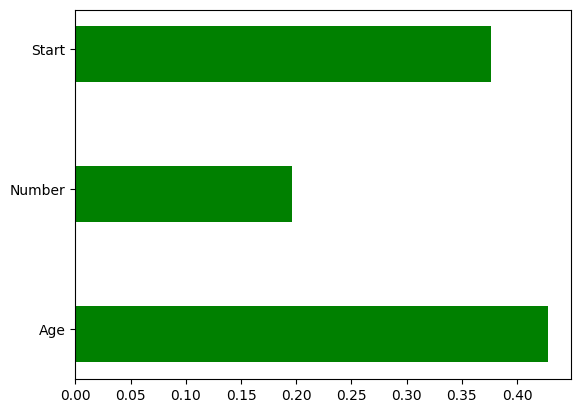

In [ ]:
#plot
fig, ax = plt.subplots()
width = 0.4 # the width of the bars
ind = np.arange(len(y_features)) # the x locations for the groups
ax.barh(ind, y_features, width, color="green")
ax.set_yticks(ind+width/10)
ax.set_yticklabels(features, minor=False)

In [ ]:
rfc.estimators_

[DecisionTreeClassifier(max_features='sqrt', random_state=802508475),
 DecisionTreeClassifier(max_features='sqrt', random_state=395164809),
 DecisionTreeClassifier(max_features='sqrt', random_state=205515917),
 DecisionTreeClassifier(max_features='sqrt', random_state=988316606),
 DecisionTreeClassifier(max_features='sqrt', random_state=1648209334),
 DecisionTreeClassifier(max_features='sqrt', random_state=911690177),
 DecisionTreeClassifier(max_features='sqrt', random_state=209301120),
 DecisionTreeClassifier(max_features='sqrt', random_state=686977535),
 DecisionTreeClassifier(max_features='sqrt', random_state=558822262),
 DecisionTreeClassifier(max_features='sqrt', random_state=761170532),
 DecisionTreeClassifier(max_features='sqrt', random_state=16607024),
 DecisionTreeClassifier(max_features='sqrt', random_state=464727857),
 DecisionTreeClassifier(max_features='sqrt', random_state=930892537),
 DecisionTreeClassifier(max_features='sqrt', random_state=608631138),
 DecisionTreeClassif

In [ ]:
rfc.estimators_[1]

DecisionTreeClassifier(max_features='sqrt', random_state=395164809)

In [ ]:
rfc.estimator_params

('criterion',
 'max_depth',
 'min_samples_split',
 'min_samples_leaf',
 'min_weight_fraction_leaf',
 'max_features',
 'max_leaf_nodes',
 'min_impurity_decrease',
 'random_state',
 'ccp_alpha',
 'monotonic_cst')

In [ ]:
from sklearn import tree

In [ ]:
fig, axes = plt.subplots(nrows = 1,ncols = 20,figsize = (10,2), dpi=3000)
for index in range(0, 20):
    tree.plot_tree(rfc.estimators_[index],
                   feature_names = features,
                   filled = True,
                   ax = axes[index]);

    axes[index].set_title('Estimator: ' + str(index), fontsize = 11)